In [5]:
import os, time, sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms,datasets
from matplotlib import pyplot as plt
from tqdm import tqdm
# from summary import summary

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

dsets_paths = "./data/imgs_Face"
transform = transforms.Compose([
    transforms.Resize((64,64)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5],[0.5, 0.5, 0.5])
    
])
dsets = datasets.ImageFolder(dsets_paths, transform)
dlsets = DataLoader(dsets, batch_size=512, shuffle = True, num_workers=4)

class torch.nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride=1, padding=0, output_padding=0, bias=True)

In [7]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.g = nn.Sequential(
            nn.ConvTranspose2d(100, 1024, 4, 1, 0),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.ConvTranspose2d(1024, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 3, 4, 2, 1),
            nn.Tanh()
        )
        
    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, x):
        y = self.g(x)
        return y
    
# G = Generator()
# print(G)
# summary(G,input_shape=(100,1,1))

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.d = nn.Sequential(
            nn.Conv2d(3, 128, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Conv2d(512, 1024, 4, 2, 1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2),
            nn.Conv2d(1024, 1, 4),
            nn.Sigmoid()
        )
        
    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, x):
        y = self.d(x)
        return y
    
def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()
        
# D = Discriminator()
# print(D)
# summary(D,input_shape=(3,64,64))

In [9]:
def show_result(size_figure_grid=3, path='result.png'):
    z = torch.randn((size_figure_grid**2, 100, 1, 1), device=device)

    G.eval()
    test_images = G(z)
    G.train()
    
    plt.figure(figsize=(size_figure_grid,size_figure_grid)) 
    for i in range(size_figure_grid**2):
        img = test_images[i]
        ax=plt.subplot(size_figure_grid,size_figure_grid,i+1)
        ax.imshow((img.cpu().data.permute(1,2,0).numpy() + 1) / 2)
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()
    plt.savefig(path)


In [10]:
def show_train_hist(hist, path='Train_hist.png'):
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iter')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    plt.savefig(path)
    plt.show()

In [16]:
train_hist = {}
train_hist['D_losses'] = []
train_hist['G_losses'] = []

# training parameters
lr = 0.0002
train_epoch = 100
k = 1
# network
G = Generator()
D = Discriminator()
G.weight_init(mean=0.0, std=0.02)
D.weight_init(mean=0.0, std=0.02)
#G.load_state_dict(torch.load('./generator_f.pkl'))
#D.load_state_dict(torch.load('./discriminator_f.pkl'))
G.to(device)
D.to(device)
G.train()
D.train()
# Binary Cross Entropy loss
BCE_loss = nn.BCELoss().to(device)
# Adam optimizer
G_optimizer = torch.optim.Adam(G.parameters(), lr=lr, betas=(0.5, 0.999))
D_optimizer = torch.optim.Adam(D.parameters(), lr=lr, betas=(0.5, 0.999))

Training start!


100%|█████████████████████████████████████████████████████████████████| 125/125 [03:18<00:00,  1.59s/it]


[1/100] - ptime: 198.64, loss_d: 1.289, loss_g: 8.087


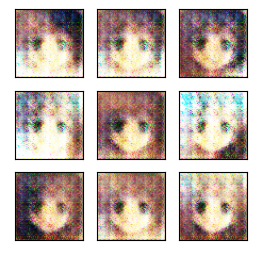

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[2/100] - ptime: 201.17, loss_d: 1.108, loss_g: 3.275


<Figure size 640x480 with 0 Axes>

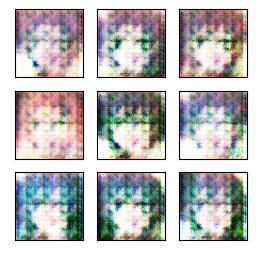

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[3/100] - ptime: 201.54, loss_d: 0.939, loss_g: 4.115


<Figure size 640x480 with 0 Axes>

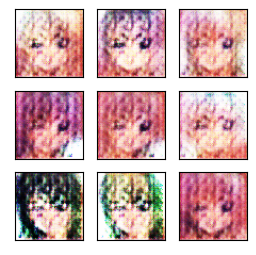

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[4/100] - ptime: 201.48, loss_d: 0.862, loss_g: 4.374


<Figure size 640x480 with 0 Axes>

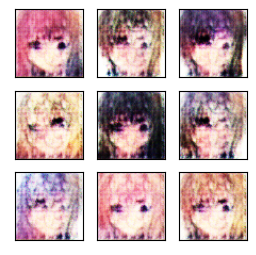

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[5/100] - ptime: 201.56, loss_d: 0.875, loss_g: 4.552


<Figure size 640x480 with 0 Axes>

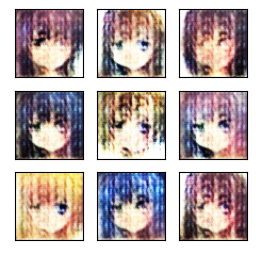

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[6/100] - ptime: 201.50, loss_d: 0.810, loss_g: 4.635


<Figure size 640x480 with 0 Axes>

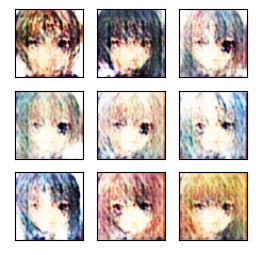

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[7/100] - ptime: 201.65, loss_d: 0.841, loss_g: 4.928


<Figure size 640x480 with 0 Axes>

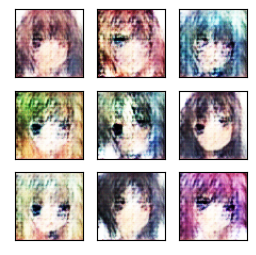

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[8/100] - ptime: 201.53, loss_d: 0.771, loss_g: 4.642


<Figure size 640x480 with 0 Axes>

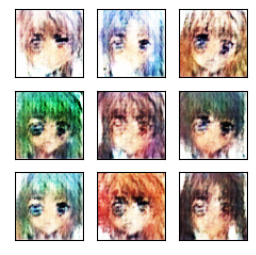

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[9/100] - ptime: 201.58, loss_d: 0.739, loss_g: 5.001


<Figure size 640x480 with 0 Axes>

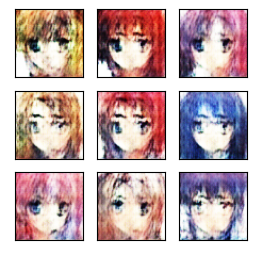

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[10/100] - ptime: 201.74, loss_d: 0.711, loss_g: 5.073


<Figure size 640x480 with 0 Axes>

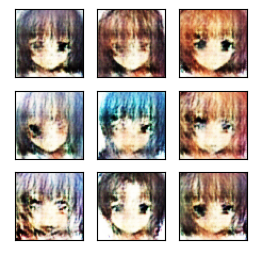

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[11/100] - ptime: 201.63, loss_d: 0.677, loss_g: 4.949


<Figure size 640x480 with 0 Axes>

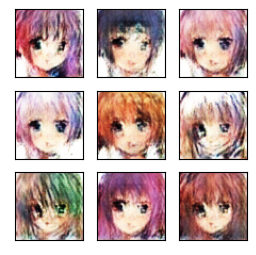

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[12/100] - ptime: 201.49, loss_d: 0.609, loss_g: 5.313


<Figure size 640x480 with 0 Axes>

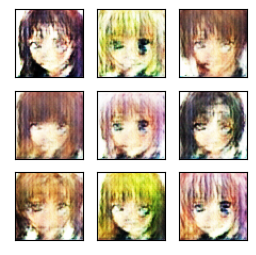

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[13/100] - ptime: 201.55, loss_d: 0.577, loss_g: 5.526


<Figure size 640x480 with 0 Axes>

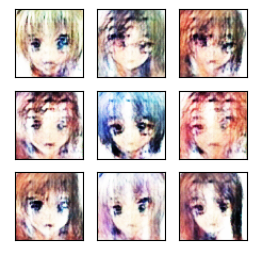

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[14/100] - ptime: 201.64, loss_d: 0.538, loss_g: 5.774


<Figure size 640x480 with 0 Axes>

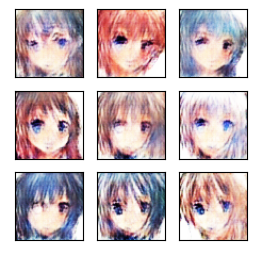

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[15/100] - ptime: 201.60, loss_d: 0.662, loss_g: 5.418


<Figure size 640x480 with 0 Axes>

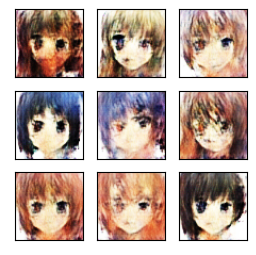

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[16/100] - ptime: 201.62, loss_d: 0.547, loss_g: 5.300


<Figure size 640x480 with 0 Axes>

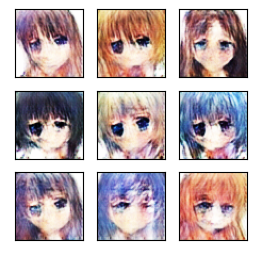

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[17/100] - ptime: 201.65, loss_d: 0.606, loss_g: 5.488


<Figure size 640x480 with 0 Axes>

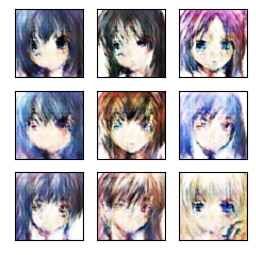

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[18/100] - ptime: 201.52, loss_d: 0.509, loss_g: 5.562


<Figure size 640x480 with 0 Axes>

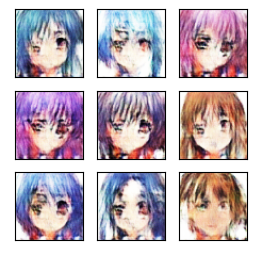

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[19/100] - ptime: 201.49, loss_d: 0.529, loss_g: 5.469


<Figure size 640x480 with 0 Axes>

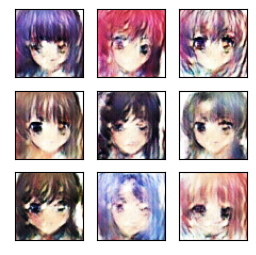

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[20/100] - ptime: 201.45, loss_d: 0.534, loss_g: 5.383


<Figure size 640x480 with 0 Axes>

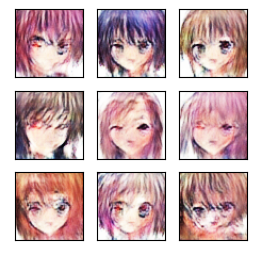

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[21/100] - ptime: 201.57, loss_d: 0.540, loss_g: 5.750


<Figure size 640x480 with 0 Axes>

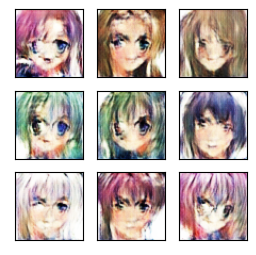

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[22/100] - ptime: 201.62, loss_d: 0.467, loss_g: 5.608


<Figure size 640x480 with 0 Axes>

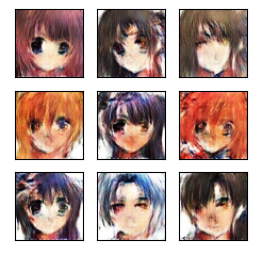

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[23/100] - ptime: 201.50, loss_d: 0.396, loss_g: 5.732


<Figure size 640x480 with 0 Axes>

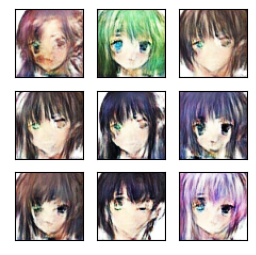

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[24/100] - ptime: 201.58, loss_d: 0.575, loss_g: 5.891


<Figure size 640x480 with 0 Axes>

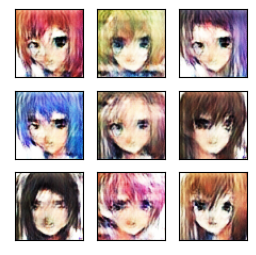

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[25/100] - ptime: 201.45, loss_d: 0.414, loss_g: 5.511


<Figure size 640x480 with 0 Axes>

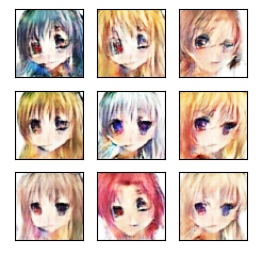

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[26/100] - ptime: 201.47, loss_d: 0.444, loss_g: 6.001


<Figure size 640x480 with 0 Axes>

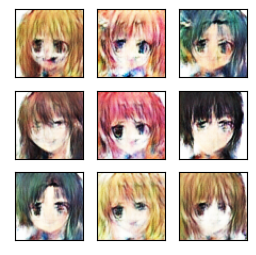

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[27/100] - ptime: 201.66, loss_d: 0.485, loss_g: 5.870


<Figure size 640x480 with 0 Axes>

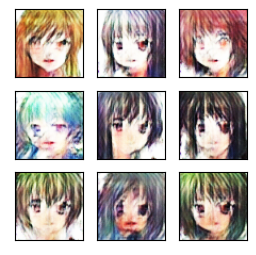

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[28/100] - ptime: 201.45, loss_d: 0.368, loss_g: 5.656


<Figure size 640x480 with 0 Axes>

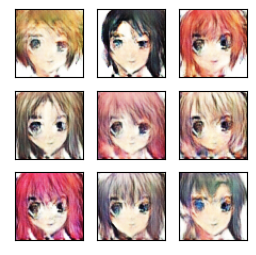

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[29/100] - ptime: 201.36, loss_d: 0.422, loss_g: 5.881


<Figure size 640x480 with 0 Axes>

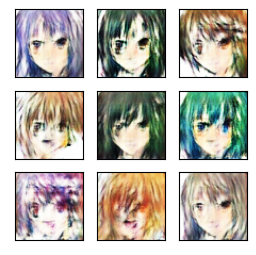

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[30/100] - ptime: 201.36, loss_d: 0.369, loss_g: 6.003


<Figure size 640x480 with 0 Axes>

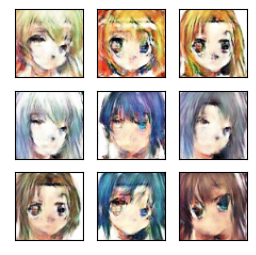

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[31/100] - ptime: 201.48, loss_d: 0.377, loss_g: 6.195


<Figure size 640x480 with 0 Axes>

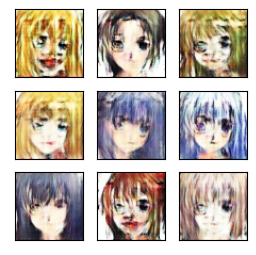

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[32/100] - ptime: 201.30, loss_d: 0.345, loss_g: 6.197


<Figure size 640x480 with 0 Axes>

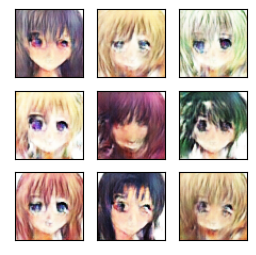

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[33/100] - ptime: 201.35, loss_d: 0.279, loss_g: 6.377


<Figure size 640x480 with 0 Axes>

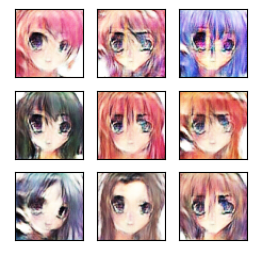

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[34/100] - ptime: 201.39, loss_d: 0.397, loss_g: 6.768


<Figure size 640x480 with 0 Axes>

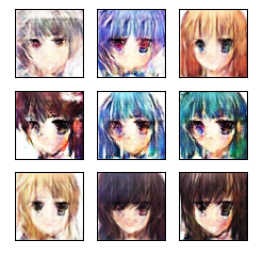

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[35/100] - ptime: 201.41, loss_d: 0.255, loss_g: 6.320


<Figure size 640x480 with 0 Axes>

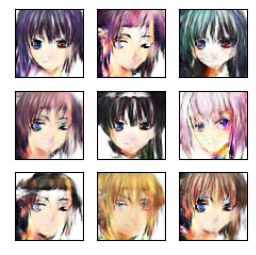

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[36/100] - ptime: 201.52, loss_d: 0.465, loss_g: 6.899


<Figure size 640x480 with 0 Axes>

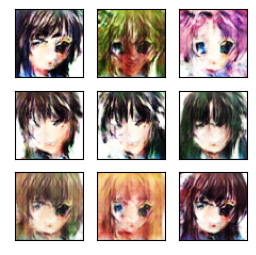

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[37/100] - ptime: 201.40, loss_d: 0.291, loss_g: 6.588


<Figure size 640x480 with 0 Axes>

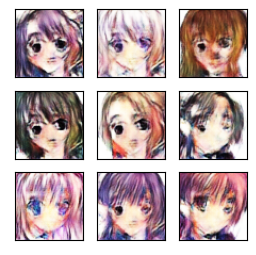

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[38/100] - ptime: 201.59, loss_d: 0.304, loss_g: 6.513


<Figure size 640x480 with 0 Axes>

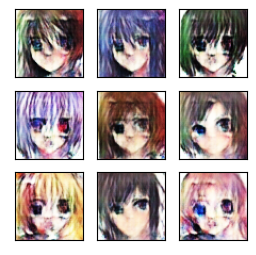

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[39/100] - ptime: 201.53, loss_d: 0.210, loss_g: 7.646


<Figure size 640x480 with 0 Axes>

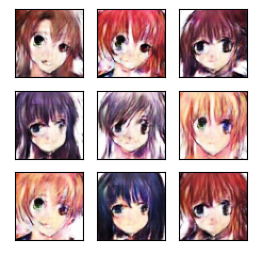

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[40/100] - ptime: 201.63, loss_d: 0.266, loss_g: 7.550


<Figure size 640x480 with 0 Axes>

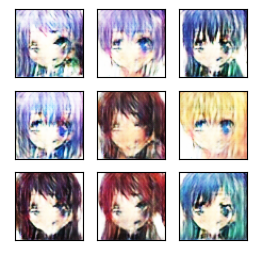

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[41/100] - ptime: 201.71, loss_d: 0.144, loss_g: 6.618


<Figure size 640x480 with 0 Axes>

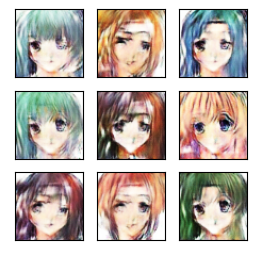

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[42/100] - ptime: 201.82, loss_d: 0.399, loss_g: 7.987


<Figure size 640x480 with 0 Axes>

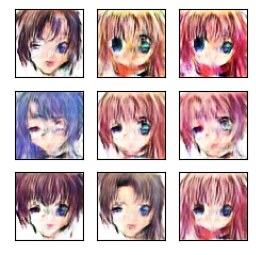

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[43/100] - ptime: 201.75, loss_d: 0.256, loss_g: 7.255


<Figure size 640x480 with 0 Axes>

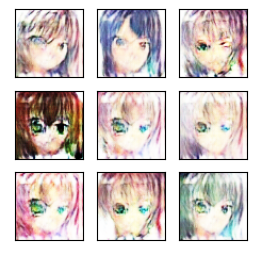

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[44/100] - ptime: 201.85, loss_d: 0.136, loss_g: 7.189


<Figure size 640x480 with 0 Axes>

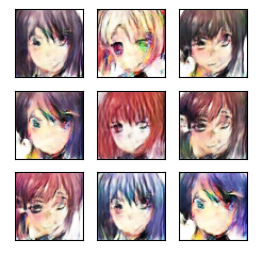

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[45/100] - ptime: 201.98, loss_d: 0.210, loss_g: 6.866


<Figure size 640x480 with 0 Axes>

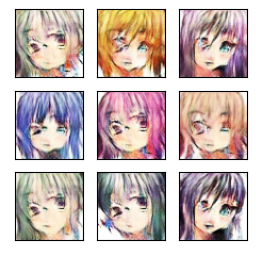

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[46/100] - ptime: 202.01, loss_d: 0.165, loss_g: 8.059


<Figure size 640x480 with 0 Axes>

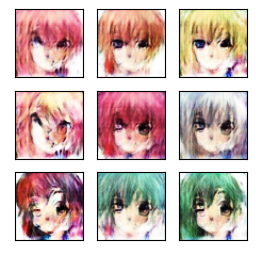

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[47/100] - ptime: 202.03, loss_d: 0.241, loss_g: 8.210


<Figure size 640x480 with 0 Axes>

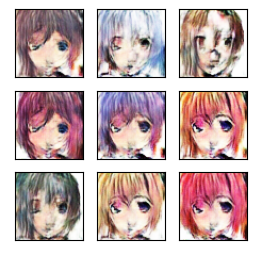

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[48/100] - ptime: 202.27, loss_d: 0.086, loss_g: 6.524


<Figure size 640x480 with 0 Axes>

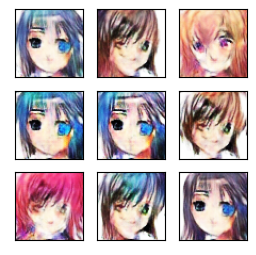

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]


[49/100] - ptime: 202.26, loss_d: 0.159, loss_g: 8.838


<Figure size 640x480 with 0 Axes>

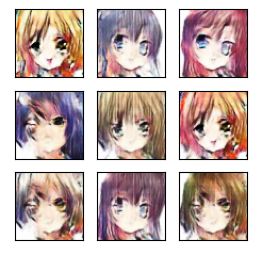

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[50/100] - ptime: 202.12, loss_d: 0.125, loss_g: 8.890


<Figure size 640x480 with 0 Axes>

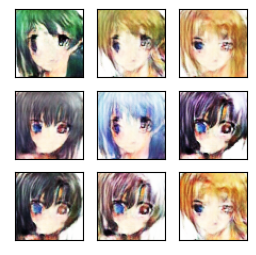

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[51/100] - ptime: 202.01, loss_d: 0.282, loss_g: 8.488


<Figure size 640x480 with 0 Axes>

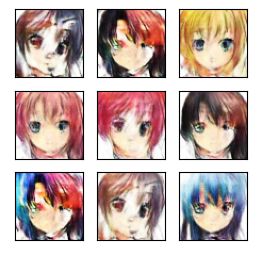

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[52/100] - ptime: 202.06, loss_d: 0.200, loss_g: 8.827


<Figure size 640x480 with 0 Axes>

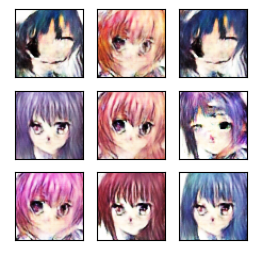

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[53/100] - ptime: 202.05, loss_d: 0.237, loss_g: 9.752


<Figure size 640x480 with 0 Axes>

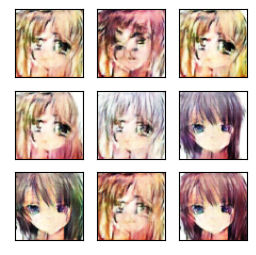

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[54/100] - ptime: 202.07, loss_d: 0.091, loss_g: 7.590


<Figure size 640x480 with 0 Axes>

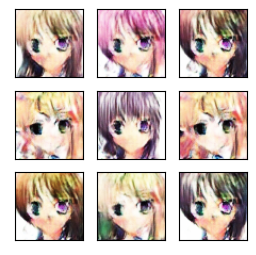

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[55/100] - ptime: 202.05, loss_d: 0.179, loss_g: 8.861


<Figure size 640x480 with 0 Axes>

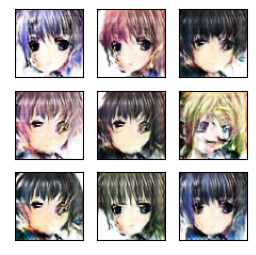

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[56/100] - ptime: 201.91, loss_d: 0.214, loss_g: 9.266


<Figure size 640x480 with 0 Axes>

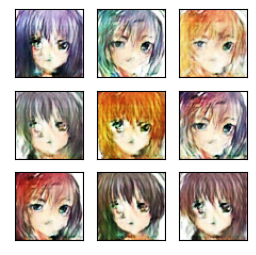

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[57/100] - ptime: 202.08, loss_d: 0.241, loss_g: 9.571


<Figure size 640x480 with 0 Axes>

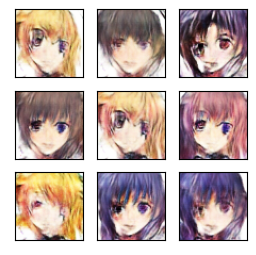

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[58/100] - ptime: 202.05, loss_d: 0.233, loss_g: 9.813


<Figure size 640x480 with 0 Axes>

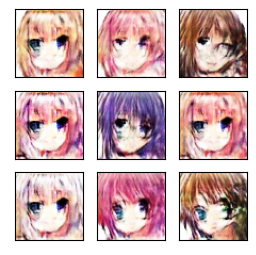

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[59/100] - ptime: 202.23, loss_d: 0.187, loss_g: 7.500


<Figure size 640x480 with 0 Axes>

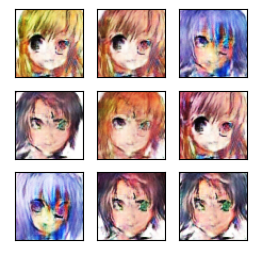

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[60/100] - ptime: 202.15, loss_d: 0.107, loss_g: 8.653


<Figure size 640x480 with 0 Axes>

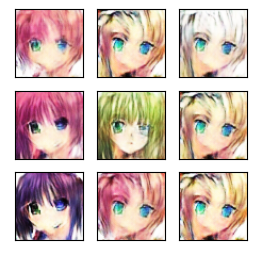

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[61/100] - ptime: 202.09, loss_d: 0.281, loss_g: 9.827


<Figure size 640x480 with 0 Axes>

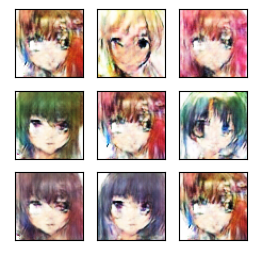

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[62/100] - ptime: 202.02, loss_d: 0.253, loss_g: 11.003


<Figure size 640x480 with 0 Axes>

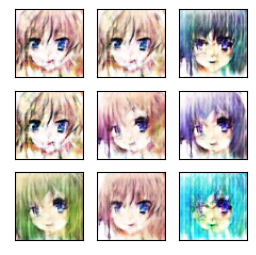

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]


[63/100] - ptime: 201.99, loss_d: 0.120, loss_g: 8.293


<Figure size 640x480 with 0 Axes>

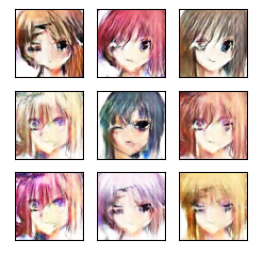

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[64/100] - ptime: 202.04, loss_d: 0.105, loss_g: 8.533


<Figure size 640x480 with 0 Axes>

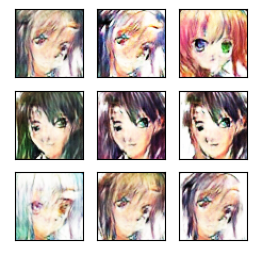

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[65/100] - ptime: 202.20, loss_d: 0.227, loss_g: 10.219


<Figure size 640x480 with 0 Axes>

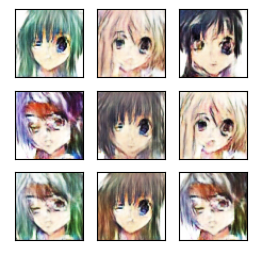

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[66/100] - ptime: 202.23, loss_d: 0.284, loss_g: 8.459


<Figure size 640x480 with 0 Axes>

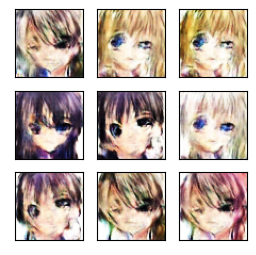

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]


[67/100] - ptime: 202.21, loss_d: 0.095, loss_g: 9.023


<Figure size 640x480 with 0 Axes>

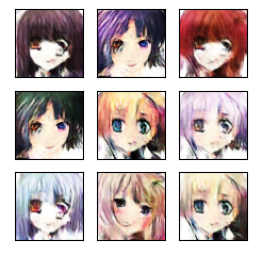

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[68/100] - ptime: 202.10, loss_d: 0.340, loss_g: 8.300


<Figure size 640x480 with 0 Axes>

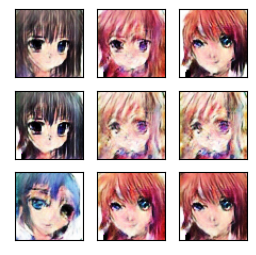

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[69/100] - ptime: 202.11, loss_d: 0.216, loss_g: 9.453


<Figure size 640x480 with 0 Axes>

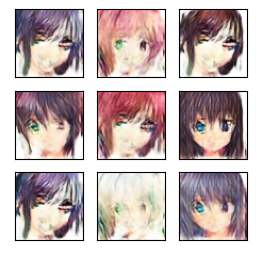

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[70/100] - ptime: 202.19, loss_d: 0.252, loss_g: 9.783


<Figure size 640x480 with 0 Axes>

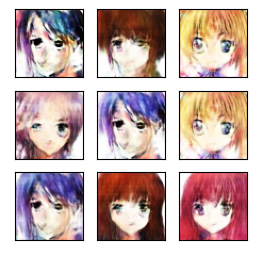

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]


[71/100] - ptime: 202.27, loss_d: 0.167, loss_g: 8.152


<Figure size 640x480 with 0 Axes>

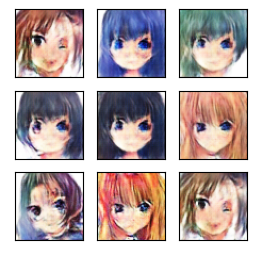

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[72/100] - ptime: 202.00, loss_d: 0.199, loss_g: 8.582


<Figure size 640x480 with 0 Axes>

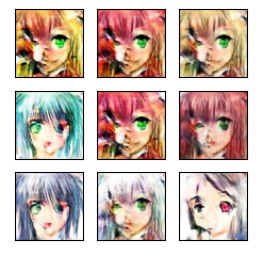

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[73/100] - ptime: 202.20, loss_d: 0.064, loss_g: 6.693


<Figure size 640x480 with 0 Axes>

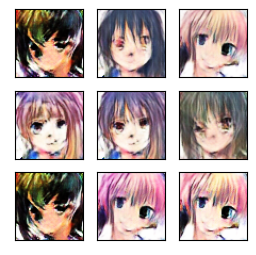

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]


[74/100] - ptime: 202.22, loss_d: 0.184, loss_g: 11.027


<Figure size 640x480 with 0 Axes>

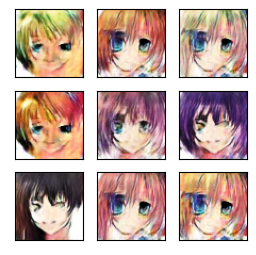

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[75/100] - ptime: 202.11, loss_d: 0.275, loss_g: 8.139


<Figure size 640x480 with 0 Axes>

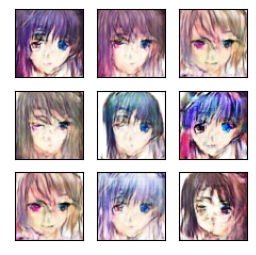

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[76/100] - ptime: 202.00, loss_d: 0.187, loss_g: 9.403


<Figure size 640x480 with 0 Axes>

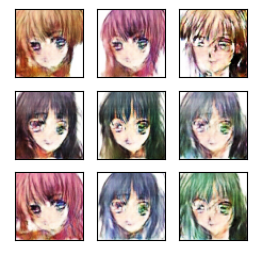

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[77/100] - ptime: 202.26, loss_d: 0.252, loss_g: 10.614


<Figure size 640x480 with 0 Axes>

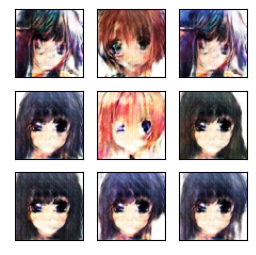

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[78/100] - ptime: 202.07, loss_d: 0.157, loss_g: 9.260


<Figure size 640x480 with 0 Axes>

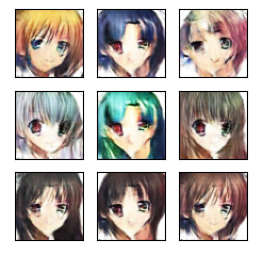

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[79/100] - ptime: 202.18, loss_d: 0.171, loss_g: 8.663


<Figure size 640x480 with 0 Axes>

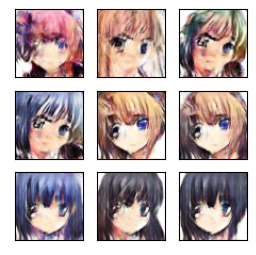

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[80/100] - ptime: 202.15, loss_d: 0.302, loss_g: 8.006


<Figure size 640x480 with 0 Axes>

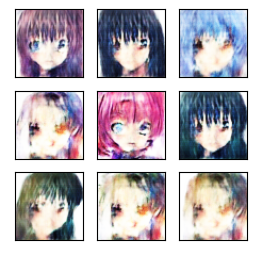

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[81/100] - ptime: 202.14, loss_d: 0.145, loss_g: 9.593


<Figure size 640x480 with 0 Axes>

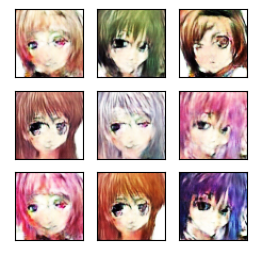

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]


[82/100] - ptime: 202.26, loss_d: 0.139, loss_g: 8.234


<Figure size 640x480 with 0 Axes>

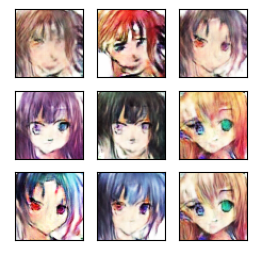

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[83/100] - ptime: 202.05, loss_d: 0.096, loss_g: 9.181


<Figure size 640x480 with 0 Axes>

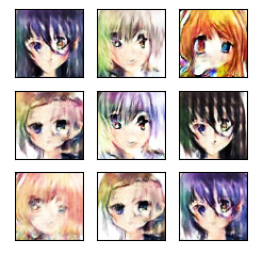

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[84/100] - ptime: 202.07, loss_d: 0.173, loss_g: 11.019


<Figure size 640x480 with 0 Axes>

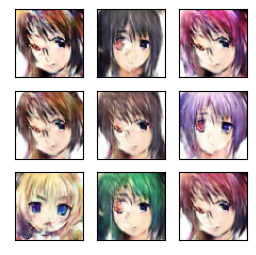

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[85/100] - ptime: 202.11, loss_d: 0.217, loss_g: 11.584


<Figure size 640x480 with 0 Axes>

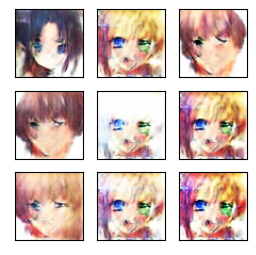

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[86/100] - ptime: 202.20, loss_d: 0.210, loss_g: 11.747


<Figure size 640x480 with 0 Axes>

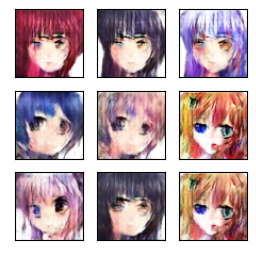

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[87/100] - ptime: 202.17, loss_d: 0.145, loss_g: 10.719


<Figure size 640x480 with 0 Axes>

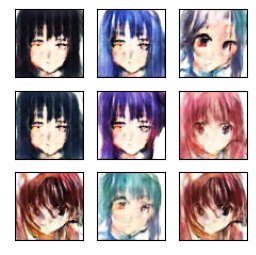

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[88/100] - ptime: 202.23, loss_d: 0.098, loss_g: 10.226


<Figure size 640x480 with 0 Axes>

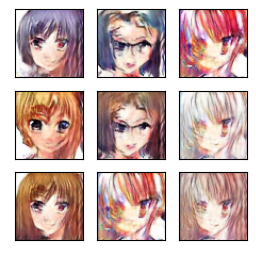

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]


[89/100] - ptime: 202.18, loss_d: 0.191, loss_g: 8.542


<Figure size 640x480 with 0 Axes>

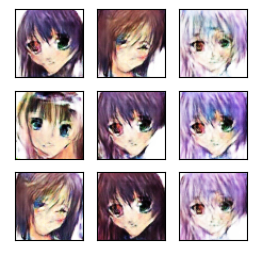

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[90/100] - ptime: 202.13, loss_d: 0.209, loss_g: 10.632


<Figure size 640x480 with 0 Axes>

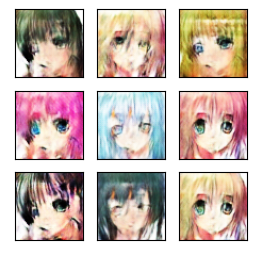

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[91/100] - ptime: 202.28, loss_d: 0.187, loss_g: 8.814


<Figure size 640x480 with 0 Axes>

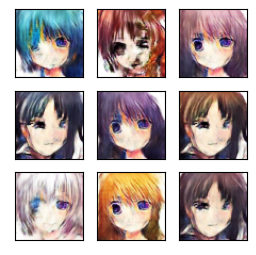

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[92/100] - ptime: 202.16, loss_d: 0.093, loss_g: 8.833


<Figure size 640x480 with 0 Axes>

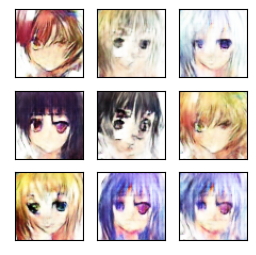

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[93/100] - ptime: 202.10, loss_d: 0.121, loss_g: 9.658


<Figure size 640x480 with 0 Axes>

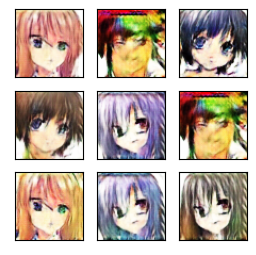

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:22<00:00,  1.62s/it]

[94/100] - ptime: 202.27, loss_d: 0.210, loss_g: 9.497


<Figure size 640x480 with 0 Axes>

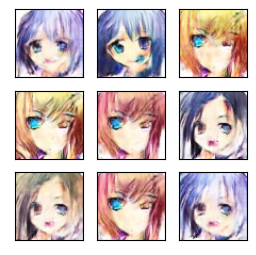

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[95/100] - ptime: 202.14, loss_d: 0.163, loss_g: 10.537


<Figure size 640x480 with 0 Axes>

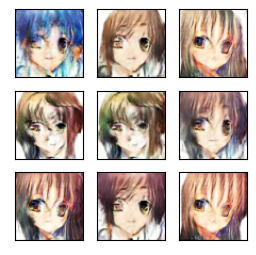

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[96/100] - ptime: 202.15, loss_d: 0.065, loss_g: 7.353


<Figure size 640x480 with 0 Axes>

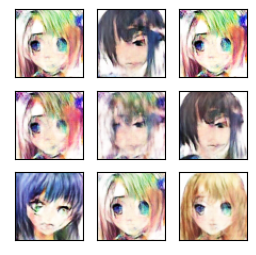

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.61s/it]

[97/100] - ptime: 202.05, loss_d: 0.271, loss_g: 14.459


<Figure size 640x480 with 0 Axes>

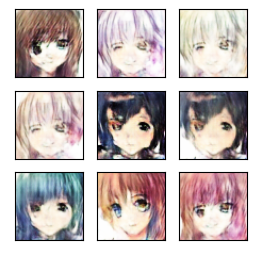

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[98/100] - ptime: 202.15, loss_d: 0.119, loss_g: 9.652


<Figure size 640x480 with 0 Axes>

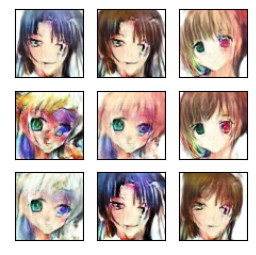

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]

[99/100] - ptime: 202.14, loss_d: 0.134, loss_g: 10.739


<Figure size 640x480 with 0 Axes>

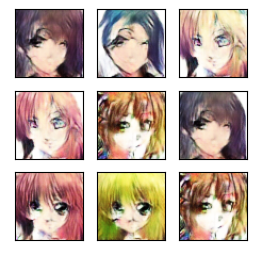

100%|█████████████████████████████████████████████████████████████████| 125/125 [03:21<00:00,  1.62s/it]


[100/100] - ptime: 202.13, loss_d: 0.206, loss_g: 12.315


<Figure size 640x480 with 0 Axes>

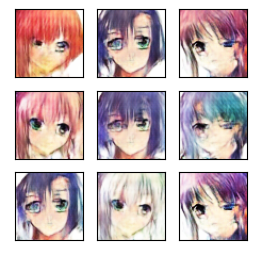

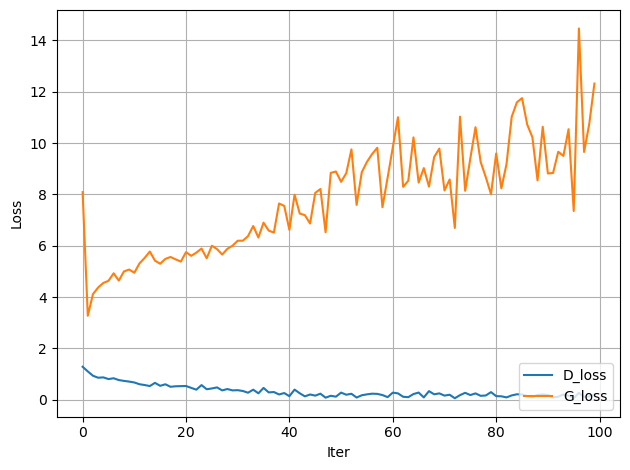

In [17]:
print('Training start!')
start_time = time.time()
for epoch in range(train_epoch):
    D_losses = []
    G_losses = []

    # learning rate decay
    # if (epoch + 1) == 11:
    #    G_optimizer.param_groups[0]['lr'] /= 10
    #    D_optimizer.param_groups[0]['lr'] /= 10
    #    print("learning rate change!")

    #if (epoch + 1) == 21:
    #    G_optimizer.param_groups[0]['lr'] /= 10
    #    D_optimizer.param_groups[0]['lr'] /= 10
    #    print("learning rate change!")

    epoch_start_time = time.time()
    for batch_idx, (x, _) in tqdm(enumerate(dlsets), total =len(dlsets)):
        # train discriminator D
        D.zero_grad()
        mini_batch = x.size()[0]
        
        y_real = torch.ones(mini_batch, device=device)
        y_fake = torch.zeros(mini_batch, device=device)
        x = x.to(device)

        D_result = D(x).squeeze()
        D_real_loss = BCE_loss(D_result, y_real)

        z = torch.randn((mini_batch, 100, 1, 1), device = device)
        G_result = G(z)

        D_result = D(G_result).squeeze()
        D_fake_loss = BCE_loss(D_result, y_fake)
        D_fake_score = D_result.data.mean()

        D_train_loss = D_real_loss + D_fake_loss

        D_train_loss.backward()
        D_optimizer.step()

        D_losses.append(D_train_loss.item())

        # train generator G
        G.zero_grad()
        
        z = torch.randn((mini_batch, 100, 1, 1), device = device)
        G_result = G(z)
        D_result = D(G_result).squeeze()
        G_train_loss = BCE_loss(D_result, y_real)  # 训练初期用log(D(G(z)))
        # G_train_loss = -BCE_loss(D_result, y_fake)  # 训练后期
        G_train_loss.backward()
        G_optimizer.step()

        G_losses.append(G_train_loss.item())

    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time

    print('[%d/%d] - ptime: %.2f, loss_d: %.3f, loss_g: %.3f' % (
    (epoch + 1), train_epoch, per_epoch_ptime, torch.mean(torch.FloatTensor(D_losses)),
    torch.mean(torch.FloatTensor(G_losses))))
    train_hist['D_losses'].append(torch.mean(torch.FloatTensor(D_losses)).item())
    train_hist['G_losses'].append(torch.mean(torch.FloatTensor(G_losses)).item())
    show_result(3)
    torch.save(G.state_dict(), './generator_f1.pkl')
    torch.save(D.state_dict(), './discriminator_f1.pkl')

show_train_hist(train_hist)

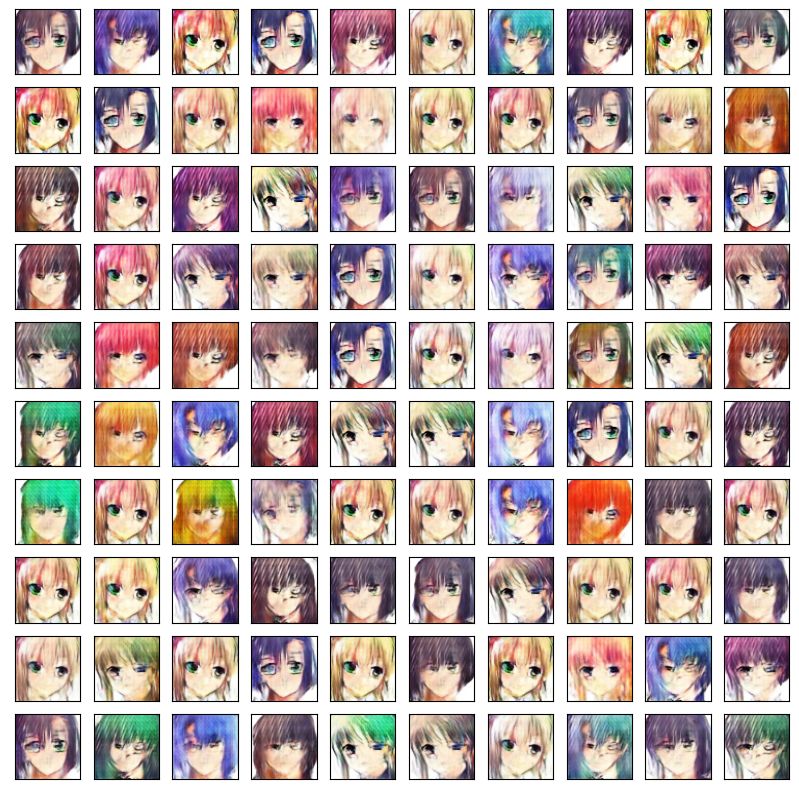

<Figure size 640x480 with 0 Axes>

In [20]:
show_result(10)